### 0. Импорт библиотек

In [3]:
#Классический набор
import numpy as np
import pandas as pd

#Первоначальная визуализация
import matplotlib.pyplot as plt
import seaborn as sns

#Плотли, раз о нём заговорили
import plotly.express as px

#Для некоторых графиков
from scipy.stats import norm
from sklearn import preprocessing

# Игнорируем всё
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### 1. Импорт файла и лирические рассуждения

In [4]:
df = pd.read_csv('bank.csv', sep=';')
df.head(10)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


Запринтовала датасет (точнее его голову (10 строк)). 21 признак (20 фичей и 1 результат)

In [5]:
print(f'Размерность данных: {df.shape}')

Размерность данных: (41188, 21)


То есть в датасете 41 (с лишком) тысяча строк (наблюдений). Теперь посмотрим на типы данных:

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

* 11 признаков пока что категориальных (Тип работы, Семейное положение, Образование, Наличие кредита, Наличие жилищного кредита, Наличие персонального кредита, Тип контактной связи, Месяц последнего контакта, День недели последнего контакта, Результат предыдущей маркетинговой кампании, Результат звонка);
* 10 числовых, но Возраст, Продолжительность разговора, Кол-во контактов, Последний контакт, Предыдущее кол-во контактов - числовые дискретные, а Процентная ставка, Индекс потребительских цен, Индекс потребительского доверия, Ставка euribor, Число занятых-числовые неприрывные

Метод describe даёт более подробное описание данных конкретного типа по df. Здесь можно углядеть пропуски данных, особенности кодировки исходного файла, подумать о нормальности распределения.

Сначала посмотрим на числовые признаки:

In [7]:
df.describe(include='number')

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


Например, мы можем понять, что с pdays что-то не так. 999 слишком часто фигурирует. Насколько я помню. Это особенности кодировки (то есть 999 - не было контакта с человеком ранее)

Теперь на категориальные. Здесь опять же можем увидеть пропуски :), внутренности категориальных данных (unique- количество уникальных значений , freq - частота)

In [8]:
df.describe(include='object')

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
count,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188
unique,12,4,8,3,3,3,2,10,5,3,2
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent,no
freq,10422,24928,12168,32588,21576,33950,26144,13769,8623,35563,36548


Проверяем на дубликаты:

In [9]:
df.duplicated().sum()

12

"Замечательно". Дубликаты есть. Они нам ни к чему. Удаляем. (inplace - вопрос перезаписи датафрейма)

In [10]:
df.drop_duplicates(inplace=True)

Проверим на пропуски:

In [11]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

Пропусков нет ни в одном из признаков. А грустно, я бы порисовала красивые графики на пропуски в данных :С

Однако это только на первый взгляд)

### 2. Визуализация

Чаще всего это ахринеть какой долгий (лично для меня) раздел данных и самый ресурсозатратный, потому что хоть я и нарисовалась графики всякой за свою короткую жизнь, но её можно выдрачивать до одури. + для каждого датасета в итоге рисую отдельные графики, на чём теряю кучу времени, но результат меня бесконечно сильно радует конечно)

Но перед тем как рисовать сами графики, спешу напомнить, что для разных признаков графики рисуются разные. поэтому для начала нам необходимо поделить признаки на числовые (дискретные и непрерывные) и категориальные:

In [12]:
categorial = [f for f in df.columns if df.dtypes[f] == 'object']
numerical_discr = [f for f in df.columns if df.dtypes[f] == 'int64']
numerical_cont = [f for f in df.columns if df.dtypes[f] == 'float64']
numerical = numerical_cont + numerical_discr

### 2.1 Визуализация категориальных признаков

Дял следующих признаков я буду рисовать графики:

In [13]:
categorial

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'poutcome',
 'y']

Создаю функцию для рисования двух сабплотов :)

In [14]:
def cat_plot(feature):
    #Создаю две области для рисования
    f, ax = plt.subplots(1, 2, figsize=(15, 5))
    #Задаю общее название графика
    plt.suptitle(f'Соотношения в {feature}')
    #Разукрашиваю левую область рисования в столбчатую диаграмму
    ax[0].tick_params(axis='x', labelrotation=30)
    chart = sns.countplot(data=df, x=feature, ax=ax[0],palette="Set2");
    #Тут я пытаюсь исправить корявые лейблы на оси х
    chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontweight='light', fontsize='x-large')
    #Для рисования пирога считаю количество уникальных значений
    feat = df.value_counts(feature)
    #Считаю количество уникальных значений в признаке
    n = len(df[feature].unique())
    #Отбираю оттенки
    colors = sns.color_palette('pastel')
    #Создаю список констант нужной длины
    exp=[0.05]*n
    #Рисую пиродочек
    plt.pie(feat, labels=feat.index, colors = colors ,labeldistance=1.05, explode= exp, autopct='%1.1f%%')
    #Показываем сие творение
    plt.show()

Рисую с помощью цикла:

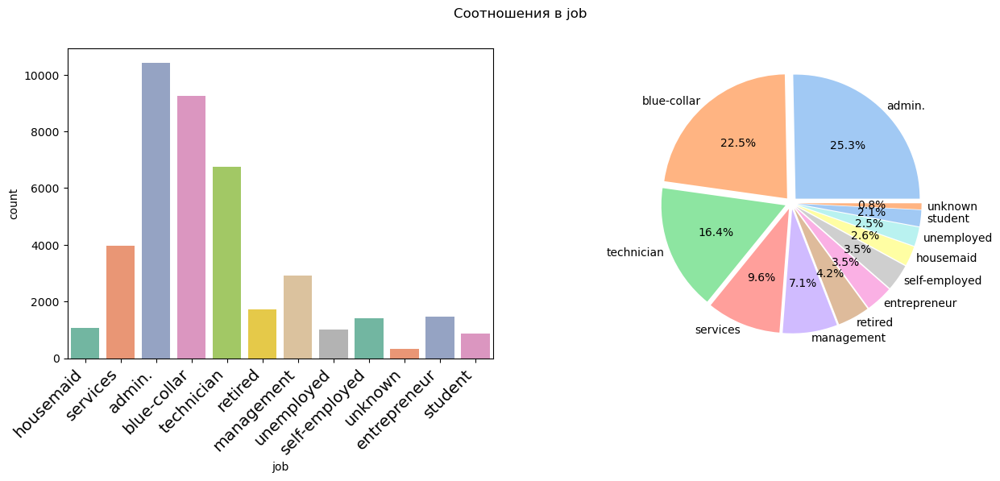

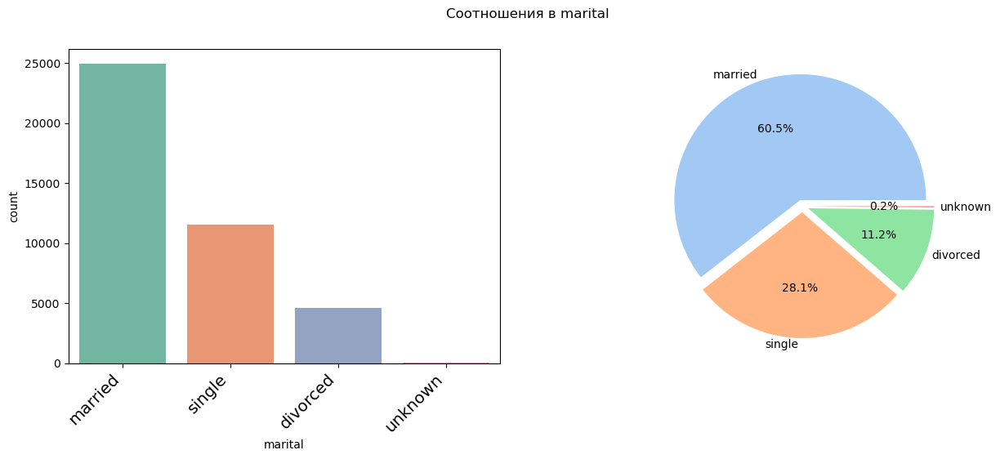

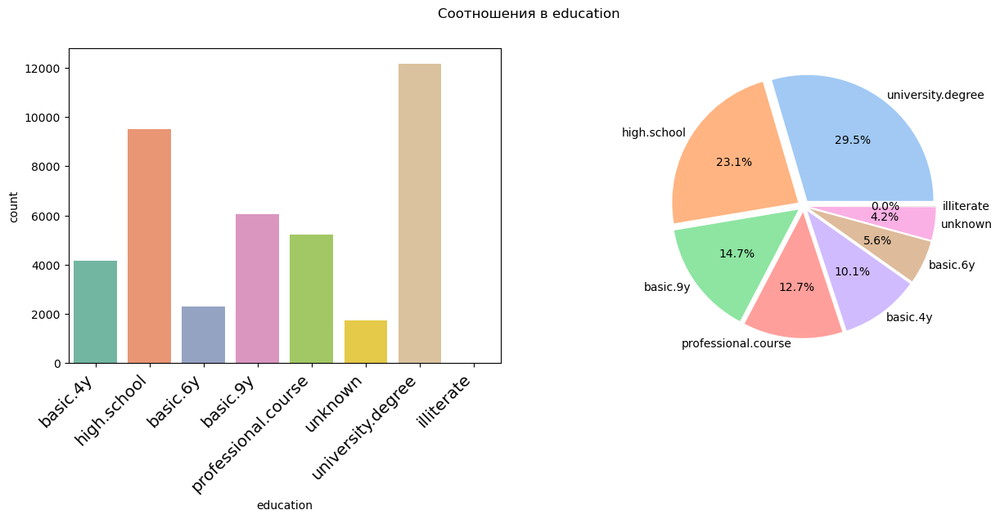

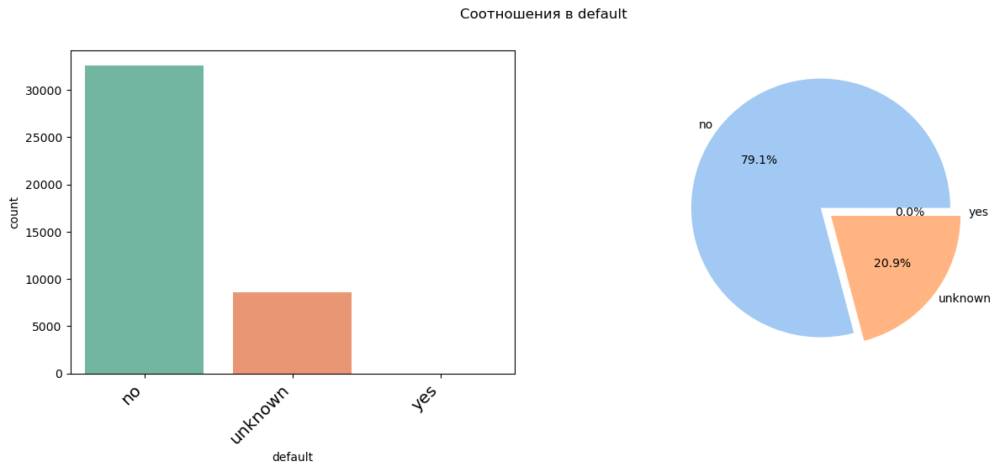

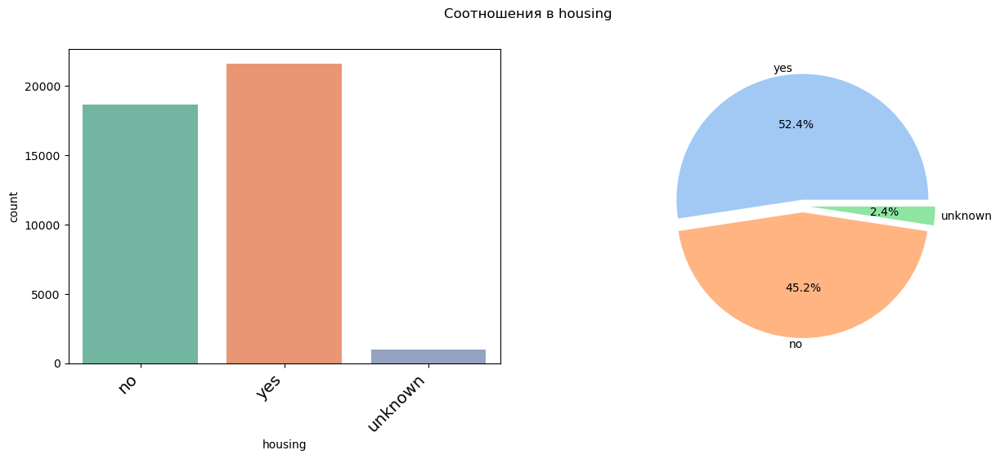

...

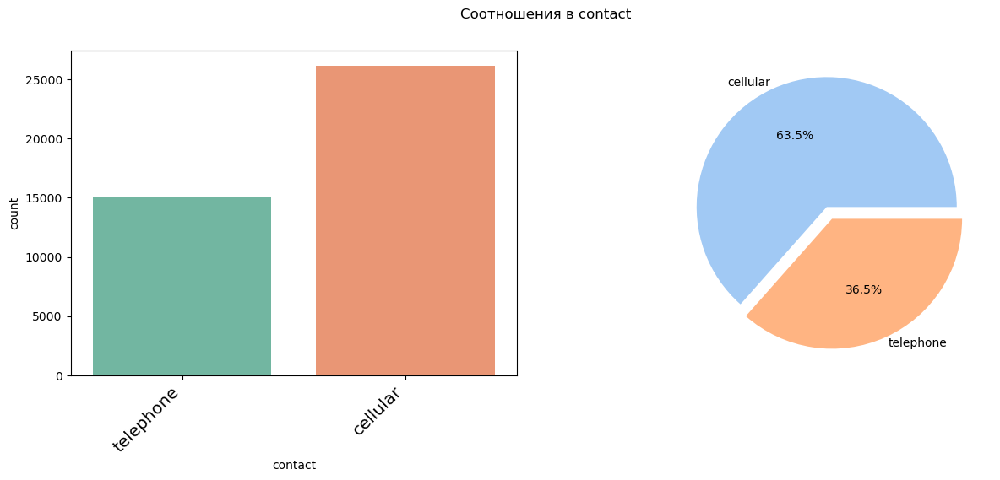

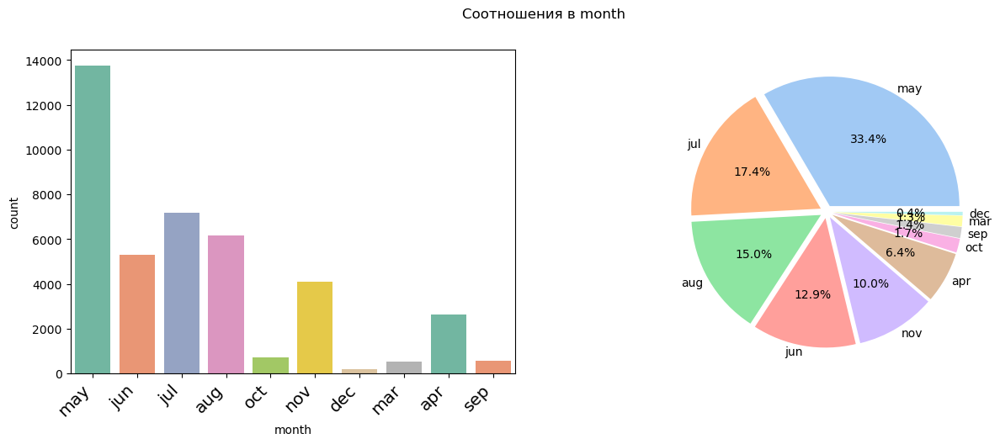

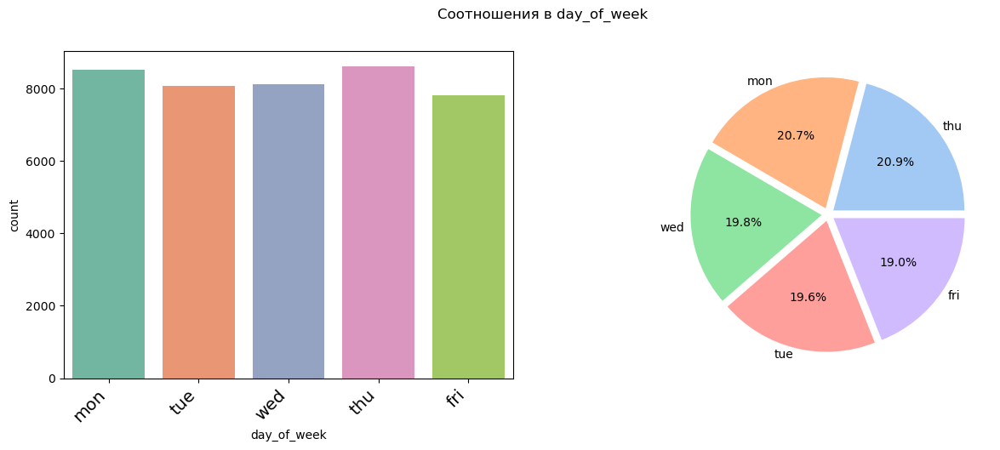

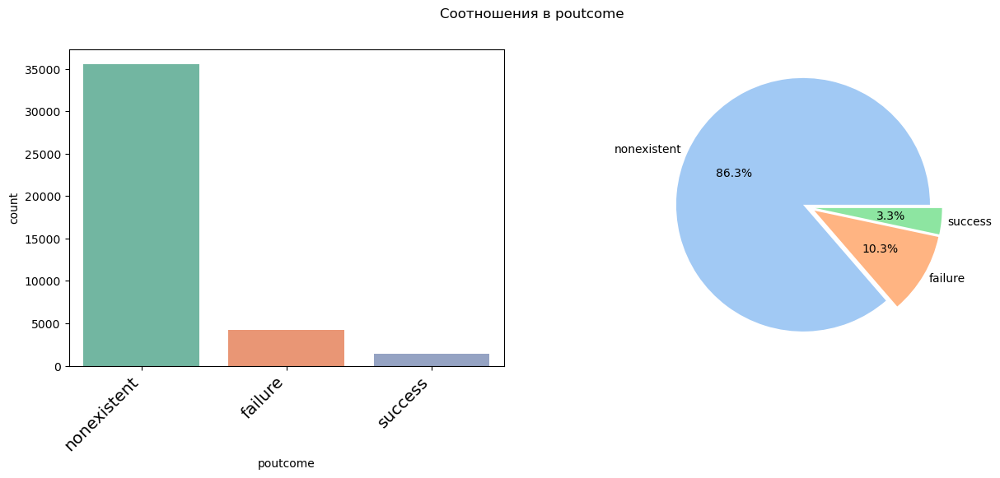

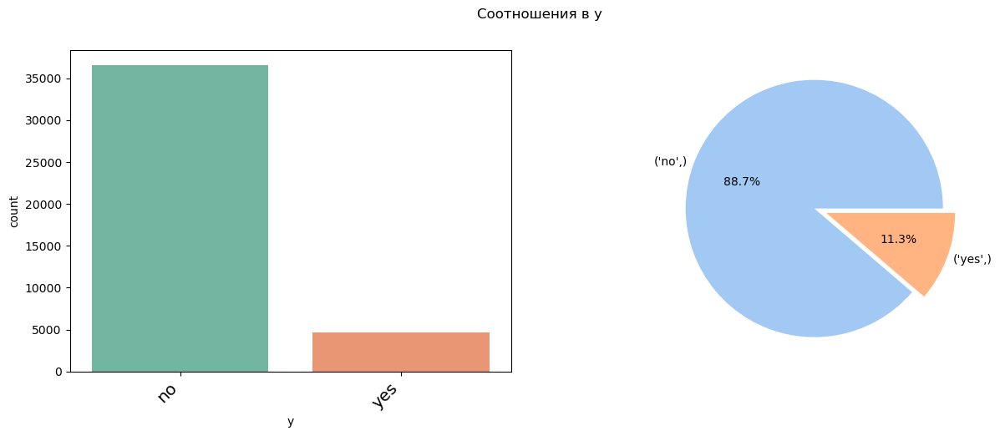

In [15]:
for c in categorial:
    cat_plot(c)

И вот теперь мы можем в прямом смысле увидеть, что isnull нам соврал, так как NaN закодированы как unknown. Что с этим делать. Подумаем в следующий раз. А пока продолжим рисовать графики для категориальных признаков:

In [16]:
def hist_cat_plot(feature):
    plt.suptitle(f'Гистограмма {feature} по отношению к результирующему признаку', fontsize=10);
    ax = sns.histplot(x = df[feature], hue=df['y'], multiple="dodge", palette="husl", alpha = 1,
                  stat = 'density', shrink = 0.8, common_norm=False)
    plt.setp(ax.get_xticklabels(), rotation=90)
    plt.show()

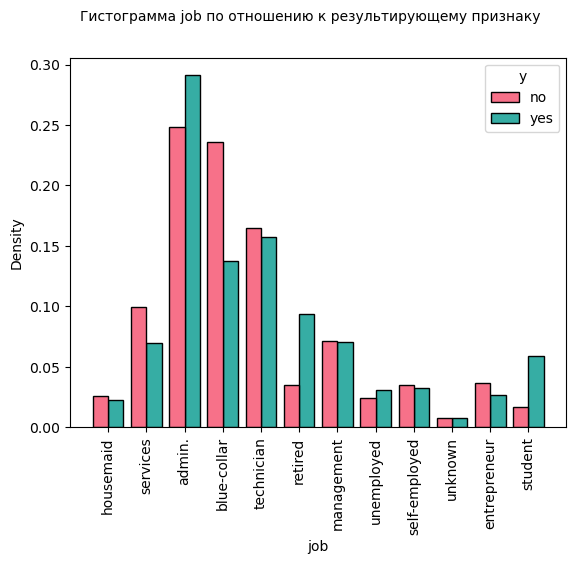

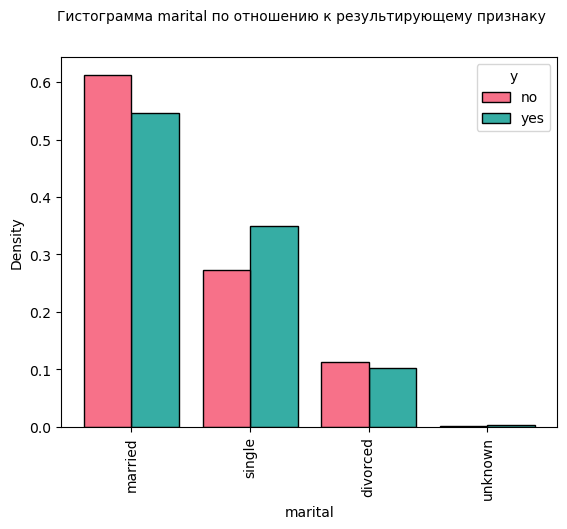

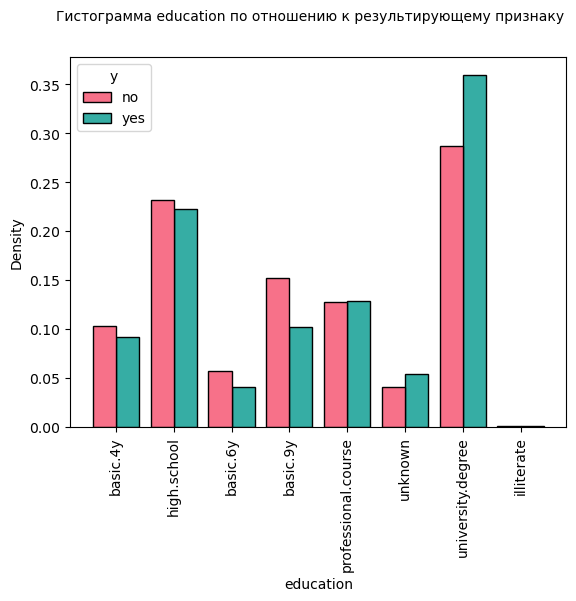

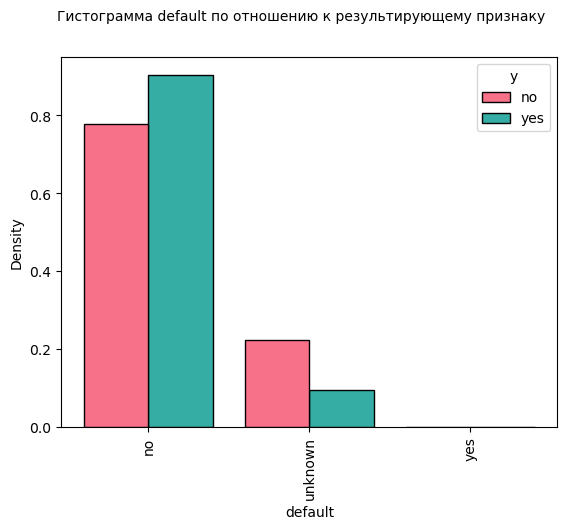

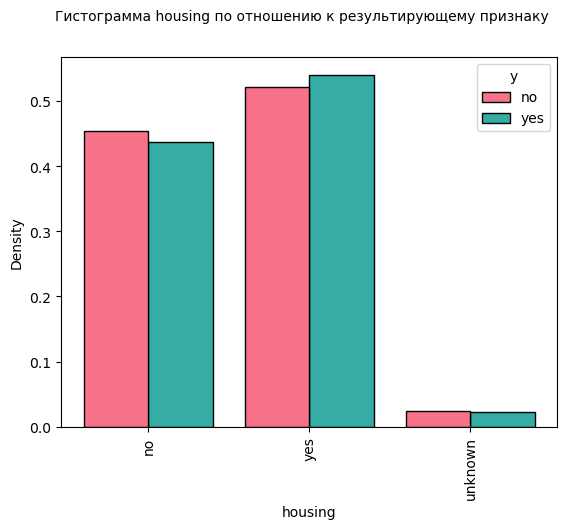

...

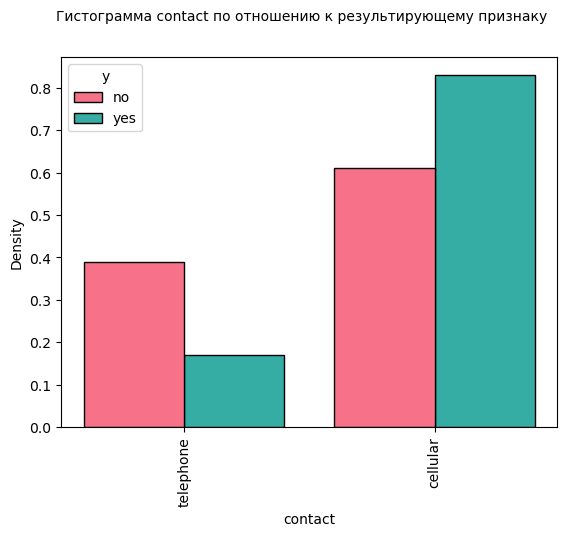

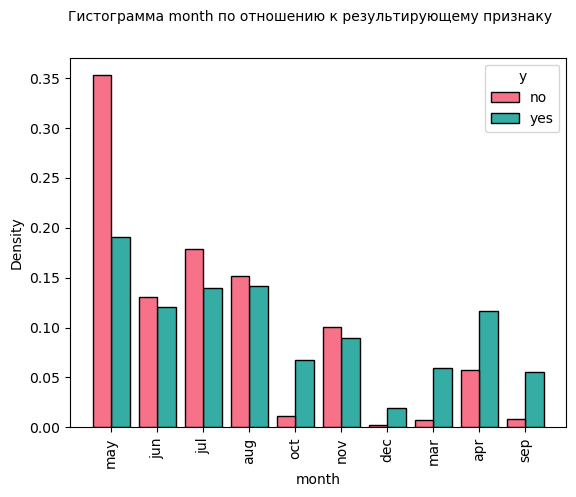

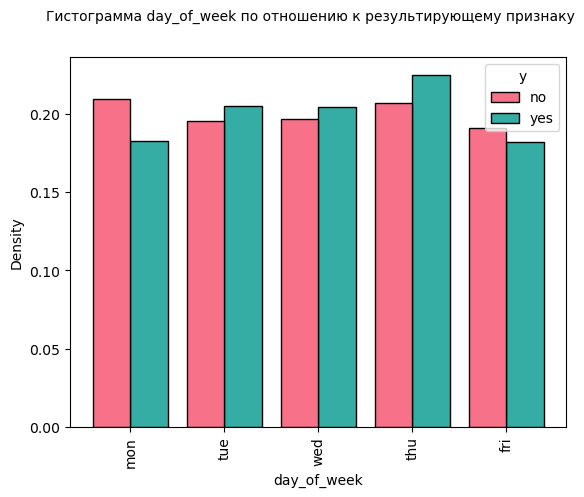

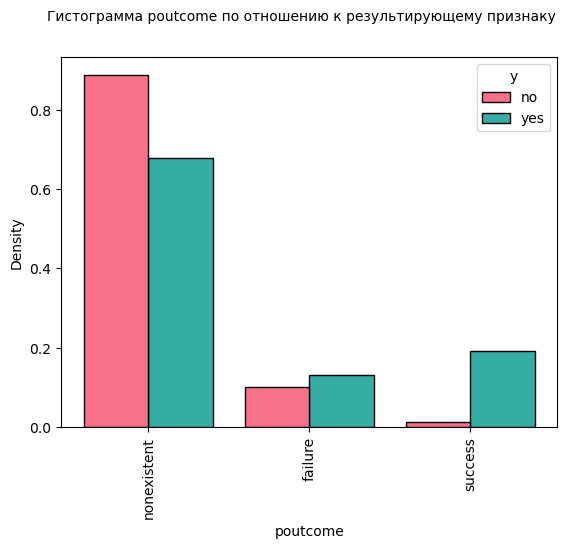

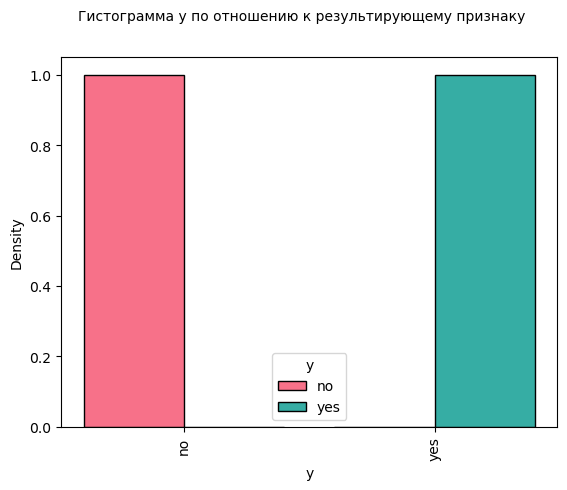

In [17]:
for c in categorial:
    hist_cat_plot(c)

### 2.2 Визуализация категориальных и числовых признаков

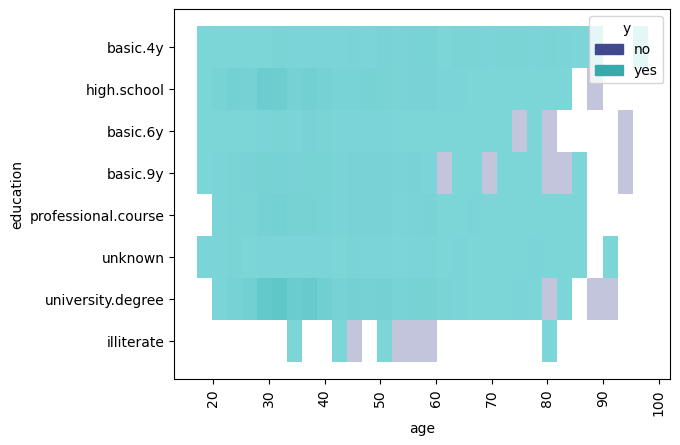

In [18]:
exper=sns.histplot(df, x=df['age'], y=df['education'], hue=df['y'], bins=30, palette="mako")
plt.setp(exper.get_xticklabels(), rotation=90)
plt.show()

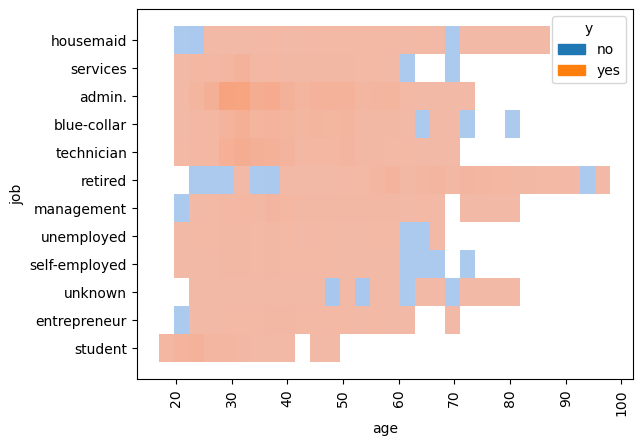

In [19]:
exper=sns.histplot(df, x=df['age'], y=df['job'], hue=df['y'], bins=30)
plt.setp(exper.get_xticklabels(), rotation=90)
plt.show()

In [20]:
def cat_num_plot(feature):
    plt.suptitle(f'Рисуночек {feature} по результирующему признаку', fontsize=10)
    sns.boxplot(data=df, x=feature, y='y', palette="viridis", notch=True, showcaps=False,
                   flierprops={"marker": "x"}, medianprops={"color": "yellow"})
    plt.show()

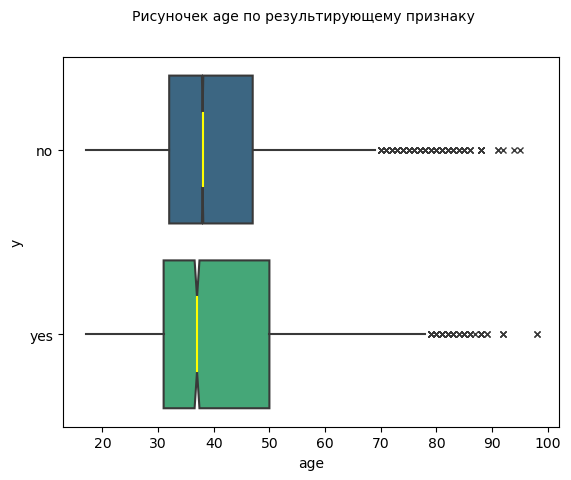

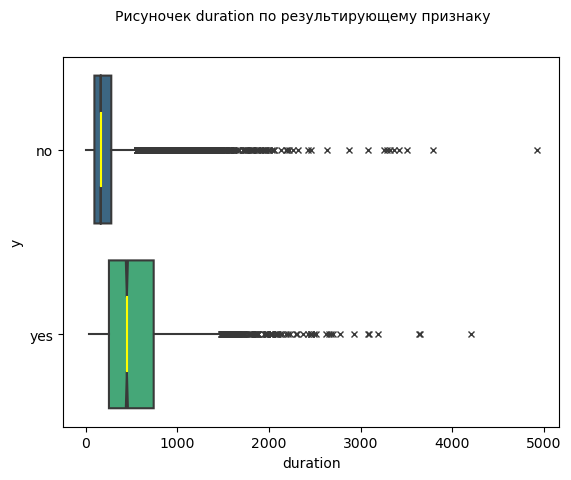

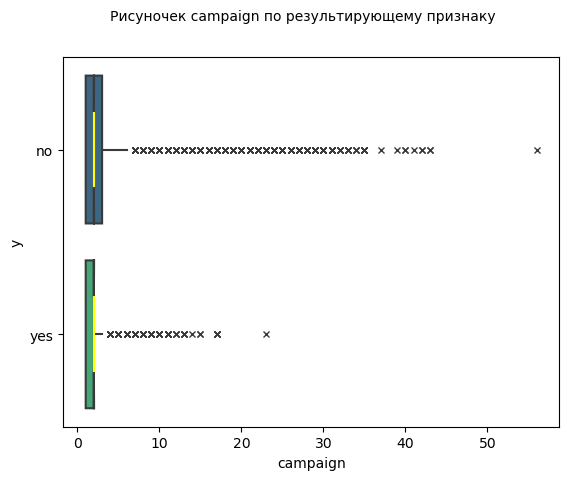

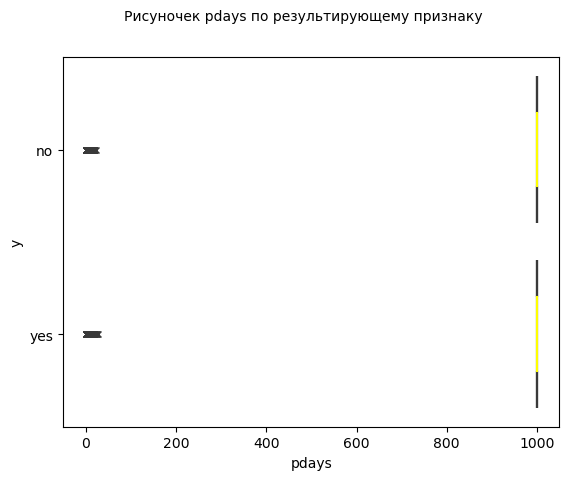

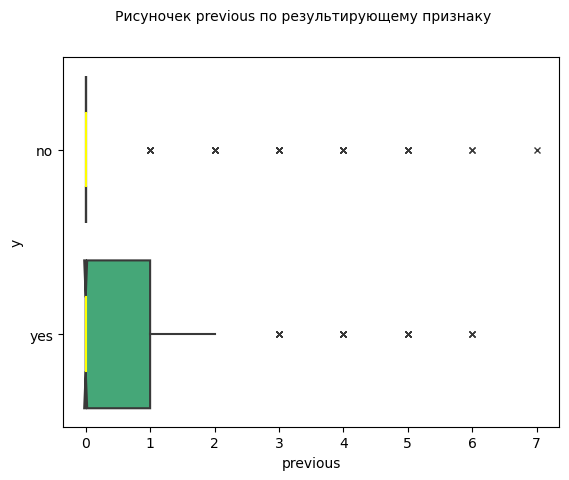

In [21]:
for c in numerical_discr:
    cat_num_plot(c)

### 2.3 Визуализация числовых признаков

По следующим признакам я буду строить графики. Сначала для дискретных:

In [22]:
numerical_discr

['age', 'duration', 'campaign', 'pdays', 'previous']

Затем для непрерывных:

In [23]:
numerical_cont

['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

C:\Users\pletneva\.conda\envs\msa\lib\site-packages\ipykernel_launcher.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\pletneva\.conda\envs\msa\lib\site-packages\ipykernel_launcher.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

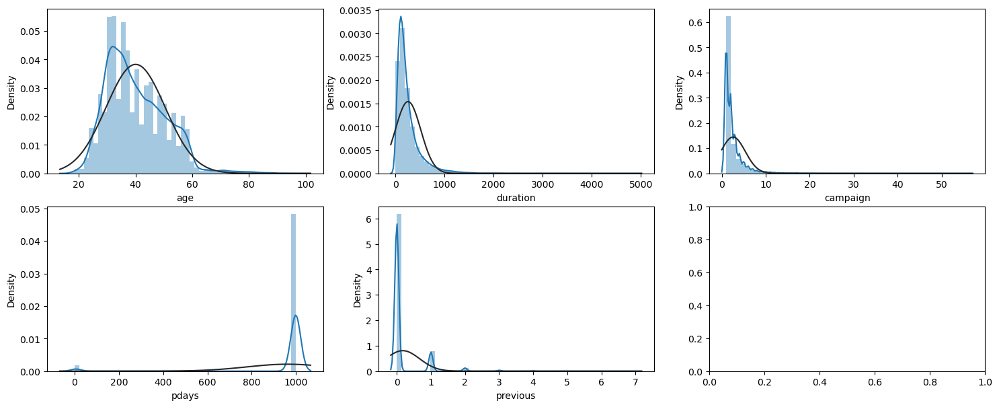

In [24]:
f, ax = plt.subplots(2, 3, figsize=(18, 7))
for i, c in enumerate(numerical_discr):
    sns.distplot(df[c], fit=norm, ax=ax[i//3, i%3])

C:\Users\pletneva\.conda\envs\msa\lib\site-packages\ipykernel_launcher.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\pletneva\.conda\envs\msa\lib\site-packages\ipykernel_launcher.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

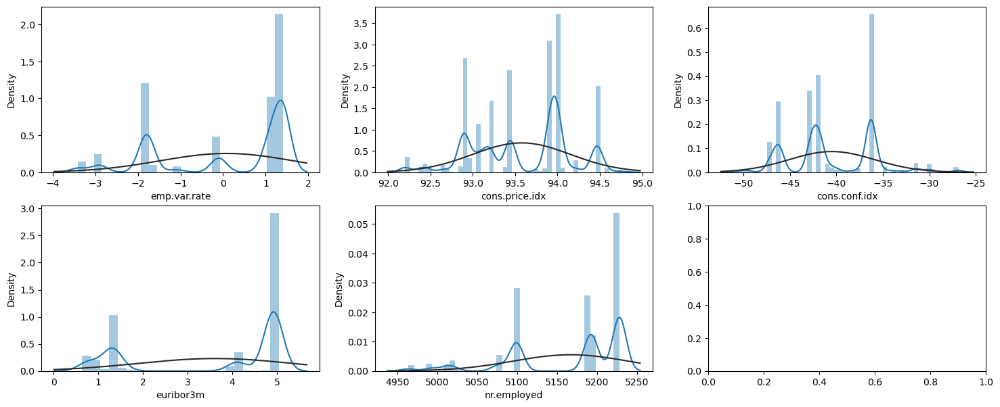

In [25]:
f, ax = plt.subplots(2, 3, figsize=(18, 7))
for i, c in enumerate(numerical_cont):
    sns.distplot(df[c], fit=norm, ax=ax[i//3, i%3])

Посмотрим визуально взаимодействие дискретных признаков с признаком age + разукрасим по отношению к результирующему признаку. Но для начала необходимо убрать из списка сам age (нечего его с самим собой смотреть):

In [26]:
numerical_discr_age=numerical_discr[1:]
numerical_discr_age

['duration', 'campaign', 'pdays', 'previous']

In [27]:
def num_plot_age(feature, rotation=90):
    f, ax = plt.subplots(1, 2, figsize=(10, 3))
    plt.suptitle(f'Рисуночек {feature} + возраст и инфа по результирующему признаку', fontsize=10)
    ax[0].tick_params(axis='x', labelrotation=30)
    ax[1].tick_params(axis='x', labelrotation=30)
    sns.scatterplot(data=df, x=feature, y='age', hue=df['y'], ax=ax[0], palette="viridis");
    ax = sns.histplot(ax=ax[1],x = df[feature], hue=df['y'], palette="viridis")
    plt.show()

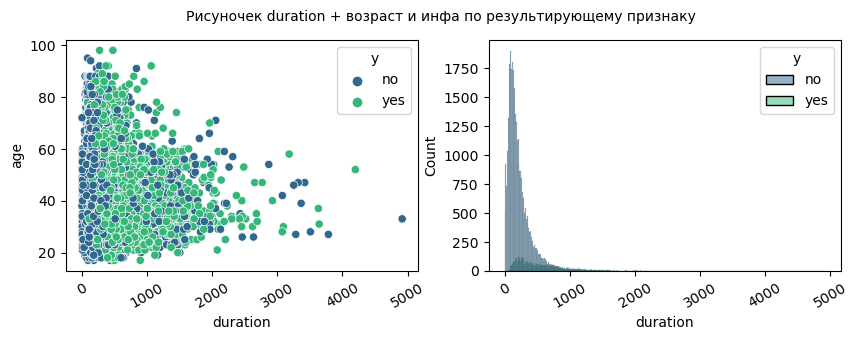

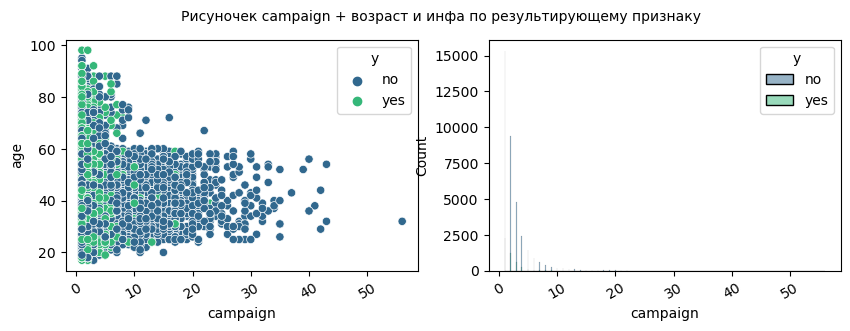

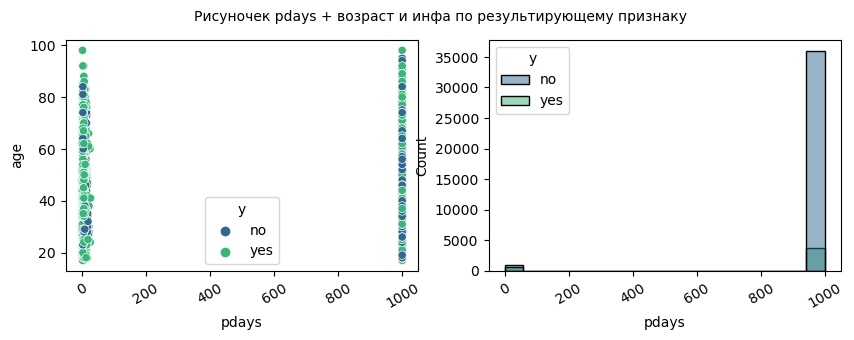

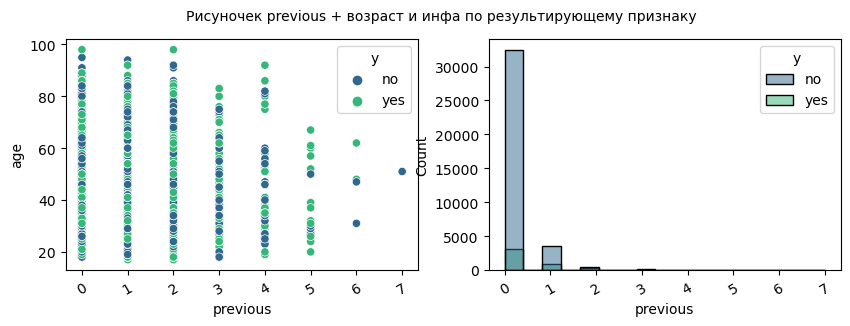

In [28]:
for c in numerical_discr_age:
    num_plot_age(c)

Теперь посмотрим на взаимодействие признаков с продолжительностью звонка:

In [29]:
numerical_discr_dur = numerical_discr_age [1:]
numerical_discr_dur

['campaign', 'pdays', 'previous']

In [30]:
def num_plot_duration(feature, rotation=90):
    plt.suptitle(f'Рисуночек {feature} + продолжительность звонка ', fontsize=10)
    sns.scatterplot(data=df, x=feature, y='duration', hue=df['y'], palette="cubehelix");
    plt.show()

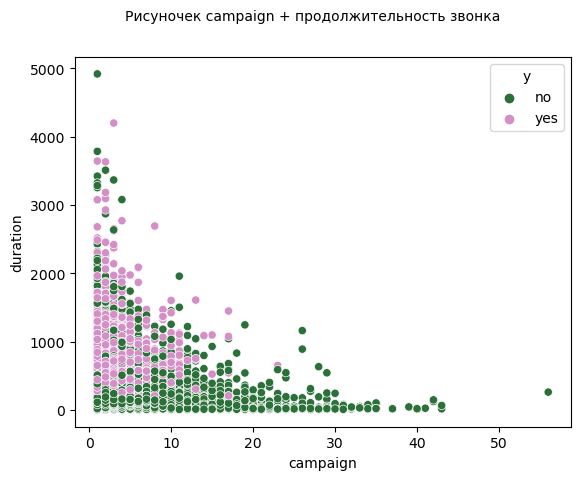

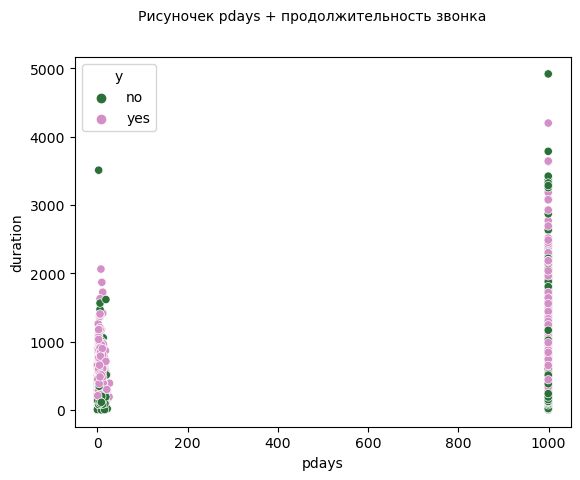

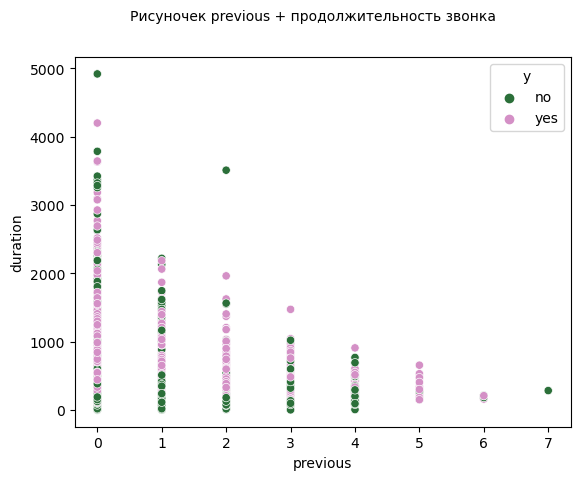

In [31]:
for c in numerical_discr_dur:
    num_plot_duration(c)

Осталось два признака. Нечего выпендриваться:

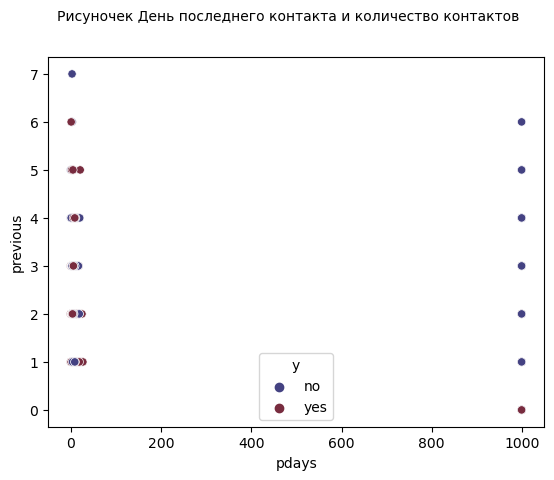

In [32]:
plt.suptitle(f'Рисуночек День последнего контакта и количество контактов', fontsize=10)
sns.scatterplot(data=df, x='pdays', y='previous', hue=df['y'], palette="icefire");
plt.show()

Мало смысла и не шибко красиво, но пусть будет.

Теперь порисуем временные ряды. Кто бы мог подумать!

In [33]:
numerical_cont

['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

In [34]:
df_t=df[['emp.var.rate','cons.price.idx', 'cons.conf.idx', 'euribor3m','nr.employed']]
df_t

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,1.1,93.994,-36.4,4.857,5191.0
1,1.1,93.994,-36.4,4.857,5191.0
2,1.1,93.994,-36.4,4.857,5191.0
3,1.1,93.994,-36.4,4.857,5191.0
4,1.1,93.994,-36.4,4.857,5191.0
...,...,...,...,...,...
41183,-1.1,94.767,-50.8,1.028,4963.6
41184,-1.1,94.767,-50.8,1.028,4963.6
41185,-1.1,94.767,-50.8,1.028,4963.6
41186,-1.1,94.767,-50.8,1.028,4963.6


In [35]:
df_t.drop_duplicates(inplace=True, ignore_index=True)
df_t

C:\Users\pletneva\.conda\envs\msa\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,1.1,93.994,-36.4,4.857,5191.0
1,1.1,93.994,-36.4,4.856,5191.0
2,1.1,93.994,-36.4,4.855,5191.0
3,1.1,93.994,-36.4,4.859,5191.0
4,1.1,93.994,-36.4,4.860,5191.0
...,...,...,...,...,...
370,-1.1,94.767,-50.8,1.039,4963.6
371,-1.1,94.767,-50.8,1.035,4963.6
372,-1.1,94.767,-50.8,1.030,4963.6
373,-1.1,94.767,-50.8,1.031,4963.6


Ошибку игнорим. Догадываюсь, почему она срабатывает, но исправлять откровенно лень. Та и зачем, если всё работает :)

In [36]:
d = preprocessing.normalize(df_t, axis=0)

names = df_t.columns

scaled_df = pd.DataFrame(d, columns=names)
scaled_df.head()

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.027153,0.051975,-0.046971,0.111372,0.05293
1,0.027153,0.051975,-0.046971,0.111349,0.05293
2,0.027153,0.051975,-0.046971,0.111326,0.05293
3,0.027153,0.051975,-0.046971,0.111418,0.05293
4,0.027153,0.051975,-0.046971,0.111441,0.05293


<AxesSubplot:>

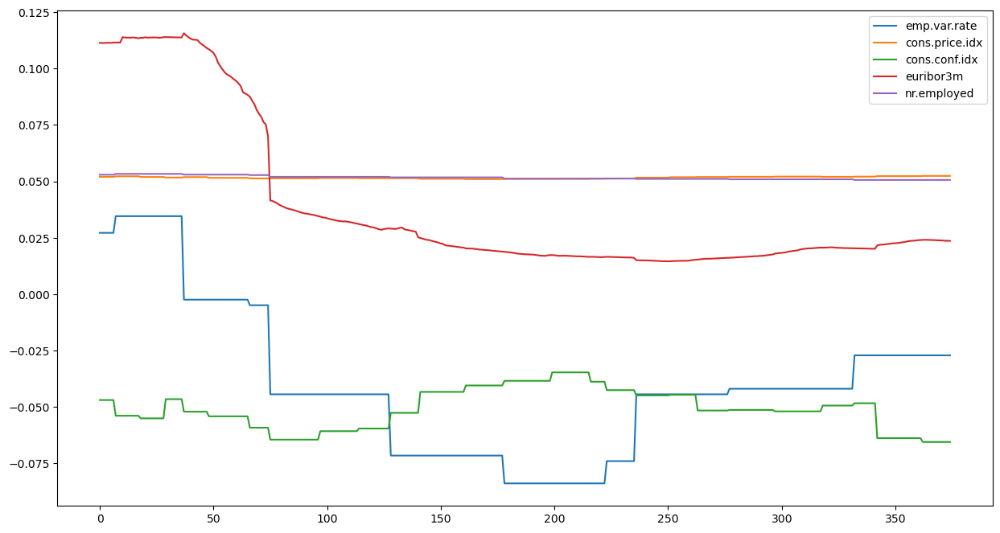

In [37]:
plt.figure(figsize=(15,8))
sns.lineplot(data = scaled_df, dashes=False)

Однако у меня не получилось такого красивого графика. Как у Димы, но в целом пойдёт :)

### 2.3.1 Plotly

In [38]:
fig = px.scatter(df, x="age", y="campaign", color="y")
fig.show()

In [39]:
fig = px.scatter(df, x="age", y="campaign", color="y", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [40]:
fig = px.density_contour(df, x="age", y="previous")
fig.show()

In [41]:
fig = px.density_heatmap(df, x="age", y="duration", marginal_x="rug", marginal_y="histogram")
fig.show()

In [42]:
fig = px.scatter_matrix(df, dimensions=["age", "duration", "campaign", "pdays", "previous"], color="y")
fig.show()

Раз пошёл разговор о плотли. Вот. Пусть будет. Чисто по приколу

Пока что на этом всё.